In [1]:
import requests

# Define the URL for the API request
url = "https://www.fotmob.com/api/leagueseasondeepstats?id=536&season=21460&type=players&stat=rating&teamId=2529"

# Send GET request (handle potential errors)
try:
    response = requests.get(url)
    response.raise_for_status()  # Raise an exception for non-200 status codes
except requests.exceptions.RequestException as e:
    print(f"An error occurred while fetching data: {e}")
    exit()

# Parse JSON data (assuming response is valid JSON)
data = response.json()

# Initialize a list to store player IDs
players_id_list = []

# Extract player IDs from the 'statsData' array
for player in data['statsData']:
    players_id_list.append(player['id'])

# Output the list of player IDs
print(players_id_list)


[307753, 351860, 463301, 535603, 534684, 210428, 1002617, 670885, 860082, 618586, 392208, 866373, 340020]


In [2]:
def StatsGenerator(player_id):
    from datetime import datetime
    import pandas as pd
    import requests
    import matplotlib.pyplot as plt
    import matplotlib.dates as mdates
    from matplotlib.dates import date2num, AutoDateLocator
    import arabic_reshaper
    import bidi.algorithm as bidi
    from bidi.algorithm import get_display
    import matplotlib.patches as patches
    import numpy as np
    from PIL import Image
    from io import BytesIO
    import matplotlib.image as mpimg
    from urllib.request import urlretrieve



    # URL to fetch data
    url = f"https://www.fotmob.com/api/playerData?id={player_id}"

    # Send GET request (handle potential errors)
    try:
      response = requests.get(url)
      response.raise_for_status()  # Raise an exception for non-200 status codes
    except requests.exceptions.RequestException as e:
      print(f"An error occurred while fetching data: {e}")
      exit()

    # Parse JSON data (assuming response is valid JSON)
    data = response.json()

    # Create empty DataFrame
    df = pd.DataFrame(columns=[
      "League Name", "Stage", "Opponent Team", "Minutes Played",
      "Match Date (UTC)", "Goals", "Assists", "Rating"
    ])

    # Extract and add data to DataFrame
    recent_matches = data.get("recentMatches", [])
    for match in recent_matches:
      league_name = match.get("leagueName")
      stage = match.get("stage")
      opponent_team_name = match.get("opponentTeamName")
      minutes_played = match.get("minutesPlayed")
      goals = match.get("goals")
      assists = match.get("assists")
      rating = match.get("ratingProps", {}).get("num")
      match_date = match.get("matchDate", {}).get("utcTime")

      # Convert match date to desired format (optional)
      if match_date:
        match_date_obj = datetime.strptime(match_date, "%Y-%m-%dT%H:%M:%S.%fZ")
        match_date_formatted = match_date_obj.strftime("%Y-%m-%d")

      # Add data as a new row using 'loc'
      df.loc[len(df)] = {
        "League Name": league_name,
        "Stage": stage,
        "Opponent Team": opponent_team_name,
        "Minutes Played": minutes_played,
        "Match Date (UTC)": match_date_formatted if match_date else match_date,
        "Goals": goals,
        "Assists": assists,
        "Rating": rating
      }


    # Load and prepare data
    n_data = 15
    try:
        df['Rating'] = pd.to_numeric(df['Rating'], errors='coerce')  # Convert 'Rating' to numeric, handle errors
    except Exception as e:
        print(f"Error converting 'Rating' to numeric: {e}")

    # Filter data
    df = df[0:n_data]  # Limit DataFrame to first 20 entries
    df = df.iloc[::-1].reset_index(drop=True)  # Reverse DataFrame
    df_filtered = df[(df['Rating'].notna()) & (df['Rating'] > 0)]  # Filter non-NaN and positive 'Rating'

    # Convert 'Match Date (UTC)' to datetime and calculate moving averages
    df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
    dates = df_filtered['Match Date (UTC)']
    dates_num = date2num(dates)

    df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
    df_filtered['MA_5'] = df_filtered['Rating'].rolling(window=5, min_periods=5).mean()


    # Load the image
    img = mpimg.imread("C:/Users/ASUS/Desktop/Lines_On_A_Football_Pitch.jpg")



    # Plotting setup
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 3.5), dpi=155)
    
     # Set the image as the background
#     ax1.imshow(img, extent=[ax.get_xlim()[0], ax.get_xlim()[1], ax.get_ylim()[0], ax.get_ylim()[1]], aspect='auto')
   

    # Plot original ratings data
    ax1.plot(dates, df_filtered['Rating'], label='Original Data', marker='o', color='#8f0000')
    
    # ax1.set_xlabel("Date")
    ax1.tick_params(axis='x', rotation=45, labelsize=7)  # Set label size
    ax1.xaxis.set_major_locator(AutoDateLocator())
    ax1.legend(loc='lower left')
    '''
    ARABIC
    '''
    text_to_be_reshaped = "تقييم اللاعب التاريخي"
    reshaped_text = arabic_reshaper.reshape(text_to_be_reshaped)
    bidi_text = get_display(reshaped_text)
    ax1.set_title(bidi_text)

    mavg3 = get_display(arabic_reshaper.reshape('متوسط متحرك 3'))
    mavg5 = get_display(arabic_reshaper.reshape('متوسط متحرك 5'))
    ax2.plot(dates, df_filtered['MA_3'], label=mavg3, marker='o', color='#0f0380', alpha=0.9)
    ax2.plot(dates, df_filtered['MA_5'], label=mavg5, marker='o', color='#31b3eb')
    ax1.set_ylabel(get_display(arabic_reshaper.reshape('التقييم')))
    ax2.set_ylabel(get_display(arabic_reshaper.reshape('متوسط متحرك')))
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax2.tick_params(axis='x', rotation=45, labelsize=7)  # Ensure consistent label size
    ax2.xaxis.set_major_locator(AutoDateLocator())  # Intelligent date tick placement
    ax2.legend(loc='lower left')

    '''
    ENGLISH
    '''
    # ax1.set_ylabel("Rating")
    # ax1.set_title("Player Rating Over Time")

    # # Add legend
    # ax1.legend(loc='lower left')


    # # Adjust the overall layout to reduce the height
    # plt.subplots_adjust(top=0.3, bottom=0.1, hspace=0.1)  # Adjust top, bottom, and hspace

    # # Plot moving averages
    # ax2.plot(dates, df_filtered['MA_3'], label='Moving Avg 3', marker='o', color='#0f0380')
    # ax2.plot(dates, df_filtered['MA_5'], label='Moving Avg 5', marker='o', color='#31b3eb')
    # # ax2.set_xlabel("Date")
    # ax1.set_ylabel("Rating")
    # ax2.set_ylabel("Moving Average")
    # ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    # ax2.tick_params(axis='x', rotation=45, labelsize=7)  # Ensure consistent label size
    # ax2.xaxis.set_major_locator(AutoDateLocator())  # Intelligent date tick placement
    # ax2.legend(loc='lower left')
    # Plot the data in the subplots with desired transparency


    # Final plot adjustments
    plt.tight_layout()

    # Get the current date and time with microseconds
    current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")

    # Define the filename with the current date and time
    filename = f"C:\\Users\\ASUS\\Desktop\\football_analysis\\{current_time}.png"

    # Save the figure with the dynamically generated filename
    plt.savefig(filename)


    url = "https://www.fotmob.com/api/playerStats?playerId="+str(player_id)+"&seasonId=2023%2F2024-536"
    url_alternative = "https://www.fotmob.com/api/playerData?id="+str(player_id)
    
    response = requests.get(url)
    data = response.json()
    
    response2 = requests.get(url_alternative)
    data_alternative = response2.json()
    
    player_name = data_alternative["name"]

    goals = None

    try:
        for item in data['topStatCard']['items']:
            if item['title'] == 'Goals':
                goals = item['statValue']
                break
    except:
        pass

    try:
        item = data["statsSection"]["items"][0]["items"][5]
    except:
        pass
    
    # Initialize variables to avoid reference errors
    shots = 0
    perc = 0
    name_player = 0
    total_goals = 0
    total_shots = 0
    shots_per90 = 0
    minutes_played = 0
    pass_accuracy = 0
    penalty_awarded = 0
    total_touches = 0

    try:
        # Check if the key 'title' exists in the item and if it equals "Shots"
        if 'title' in item and item["title"] == "Shots":
            shots = item.get("statValue", 0)  # Use .get() with default value 0
            perc = item.get("per90", 0)       # Use .get() with default value 0
    except Exception:
        shots = 0
        perc = 0

    try:
        # Assuming 'player_name' and 'goals' are defined elsewhere in your code
        name_player = player_name
        total_goals = goals
    except Exception:
        name_player = 0
        total_goals = 0

    try:
        total_shots = shots
        shots_per90 = perc
    except Exception:
        total_shots = 0
        shots_per90 = 0

    try:
        minutes_played = data['topStatCard']['items'][5].get('statValue', 0)
    except Exception:
        minutes_played = 0

    try:
        pass_accuracy = data['statsSection']['items'][1]['items'][3].get('statValue', 0)
    except Exception:
        pass_accuracy = 0

    try:
        penalty_awarded = data['statsSection']['items'][2]['items'][6].get('statValue', 0)
    except Exception:
        penalty_awarded = 0

    try:
        total_touches = data['statsSection']['items'][2]['items'][2].get('statValue', 0)
    except Exception:
        total_touches = 0


    # Dictionary to store player stats
    data = {
        name_player: get_display(arabic_reshaper.reshape('أسم اللاعب')),
        total_goals: get_display(arabic_reshaper.reshape('عدد الأهداف')),
        total_shots: get_display(arabic_reshaper.reshape('عدد التسديدات')),
        shots_per90: get_display(arabic_reshaper.reshape('التسديدات لكل 90 دقيقة')),
        minutes_played: get_display(arabic_reshaper.reshape('دقائق اللعب')),
        pass_accuracy: get_display(arabic_reshaper.reshape('دقة المناولة')),
        penalty_awarded: get_display(arabic_reshaper.reshape('ضربات جزاء مكتسبة')),
        total_touches: get_display(arabic_reshaper.reshape('عدد اللمسات'))
    }



    # Split data into two groups for the subplots
    data_top = {k: data[k] for k in list(data)[:4]}
    data_bottom = {k: data[k] for k in list(data)[4:]}


    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 2),  dpi=300)

    # Function to plot data in a table format
    def plot_table(ax, data, title):
        ax.axis('tight')
        ax.axis('off')
        table_data = [[key, value] for key, value in data.items()]  # Prepare data for the table
        table = ax.table(cellText=table_data, cellLoc='center', loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 1.4)  # Adjust table scale for better fit in the figure

    # Plot the data in the subplots
    try:
        plot_table(ax1, data_top, "Top Data")
    except:
        pass
    try:
        plot_table(ax2, data_bottom, "Bottom Data")
    except:
        pass

    # Adjust layout
    plt.tight_layout()

    # Get the current date and time with microseconds
    current_time_data = datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")

    # Define the filename with the current date and time
    filename_data = f"C:\\Users\\ASUS\\Desktop\\football_analysis\\{current_time_data}.png"

    # Save the figure with the dynamically generated filename
    plt.savefig(filename_data, transparent=True)
    plt.close()



    # Load the image
    img = mpimg.imread("C:/Users/ASUS/Desktop/Lines_On_A_Football_Pitch.jpg")

    # Create a new figure with specific dimensions and black background
    fig, ax = plt.subplots(figsize=(8, 6), dpi=155, facecolor='#000000')

    # Display the image with adjusted extent and aspect
    ax.imshow(img, aspect='auto', extent=[0, 1, 0, 1])

    # Adjust the axes limits to ensure the image fills the figure
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    # Optionally, adjust the layout to minimize padding
    fig.tight_layout(pad=0)


    # Define the outer rectangle with rounded corners
    rounded_rectangle = patches.FancyBboxPatch((0.1, 0.1), 0.8, 0.6, 
                                               boxstyle="round,pad=0.05,rounding_size=0.02", 
                                               edgecolor='white', facecolor='none', linewidth=.5)
    ax.add_patch(rounded_rectangle)

    # Load the images from URL

        # the player
    img_url = 'https://images.fotmob.com/image_resources/playerimages/'+str(player_id)+'.png'
    response = requests.get(img_url)
    img = Image.open(BytesIO(response.content))

    # Convert the image to RGBA if it's not already
    if img.mode != 'RGBA':
        img = img.convert('RGBA')

    # Convert the image to an array and display it
    img_array = np.array(img)
    im = ax.imshow(img_array, extent=(0.1, 0.3, 0.5, 0.7), origin='upper', zorder=1)

    # Define the center and radius of the circular clip
    center_x = (0.1 + 0.3) / 2
    center_y = (0.5 + 0.7) / 2
    radius = (0.3 - 0.1) / 2  # This creates a circle that fits within the extent

        # the club
    club_img_url = 'https://images.fotmob.com/image_resources/logo/teamlogo/2529.png'
    club_response = requests.get(club_img_url)
    club_img = Image.open(BytesIO(club_response.content))

    # Convert the image to RGBA if it's not already
    if club_img.mode != 'RGBA':
        club_img = club_img.convert('RGBA')

    club_img_array = np.array(club_img)
    im2 = ax.imshow(club_img_array, extent=(0.25, 0.30, 0.5, 0.55), origin='upper', zorder=2)


    # Define and add a horizontal line
    ax.axhline(y=0.49, xmin=0.11, xmax=0.89, color='white', linestyle='-', linewidth=0.5)

    # Load the image from the specified path
    image_path = filename
    image = mpimg.imread(image_path)

    # Define the coordinates and size of the image area below the horizontal line
    image_x = 0.15  # Start of the image on the x-axis
    image_y = 0.1  # Start of the image on the y-axis (bottom of the main rectangle)
    image_width = 0.7  # Same width as the outer rectangle
    image_height = 0.38  # Height adjusted to fill below the line

    # Display the image within the defined area
    ax.imshow(image, aspect='auto', extent=(image_x, image_x + image_width, image_y, image_y + image_height))



    """
    # Load the statistics data
    """
    # Load the image from the specified path
    image_data = mpimg.imread(filename_data)

    # Define the coordinates and size of the image area below the horizontal line
    # Display the image within the defined area
    ax.imshow(image_data, aspect='auto', extent=(0.35, 0.8 , 0.5, 0.7))



    '''
    Load the rights image
    '''

    # Load the image from the specified path
    image_rights = mpimg.imread("C:/Users/ASUS/Desktop/rights_logo - Copy.png")

    # Define the coordinates and size of the image area below the horizontal line
    # Display the image within the defined area
    ax.imshow(image_rights, aspect='auto', extent=(0.8, 0.97 , 0.01, 0.11), zorder=8)

    # # Set the limits of the plot to ensure all parts are visible
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 0.8)

    # Add player's name as a title
    ax.set_title(player_name, color='white')

    # Add my work rights
    ax.set_xlabel(get_display(arabic_reshaper.reshape('تم التحليل بواسطة عبدالعزيز الجميعه _ تويتر @_xc_gx_')), color='white')

    # Set equal scaling
    ax.set_aspect('auto', adjustable='datalim')

    # Optionally, remove the white space around the image
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    # Remove axes
    ax.axis('off')



    # Get the current date and time with microseconds
    current_time_data_final = datetime.now().strftime("%Y-%m-%d_%H-%M-%S-%f")

    # Define the filename with the current date and time
    filename_data_final = f"C:\\Users\\ASUS\\Desktop\\football_analysis\\{player_name}.png"

    # Save the figure with the dynamically generated filename
    plt.savefig(filename_data_final, transparent=True)

    # Show the plot
    plt.show()

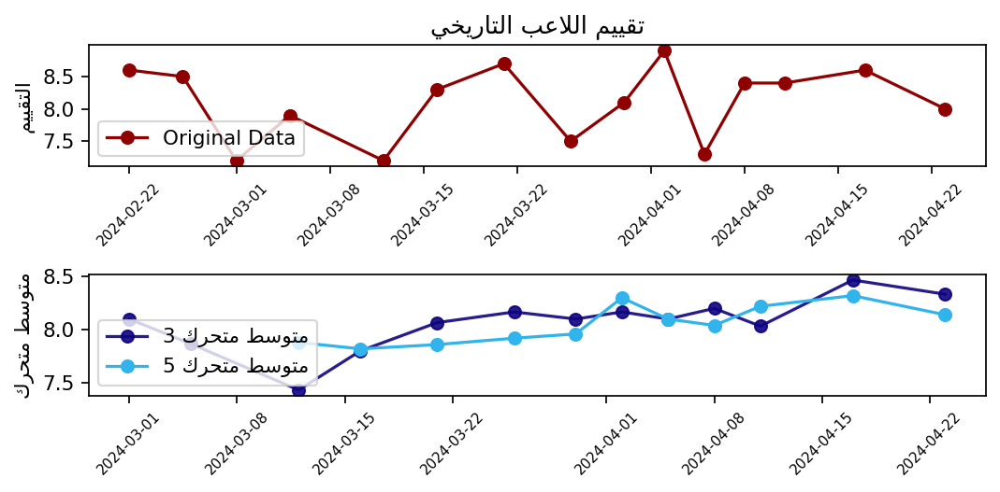

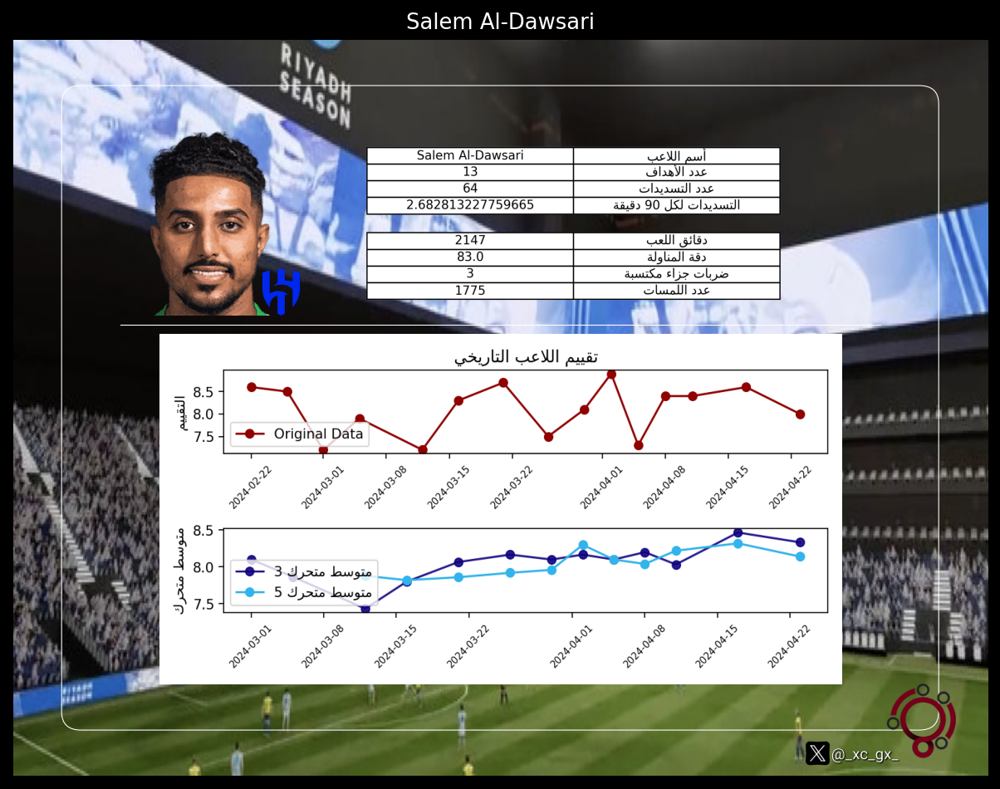

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

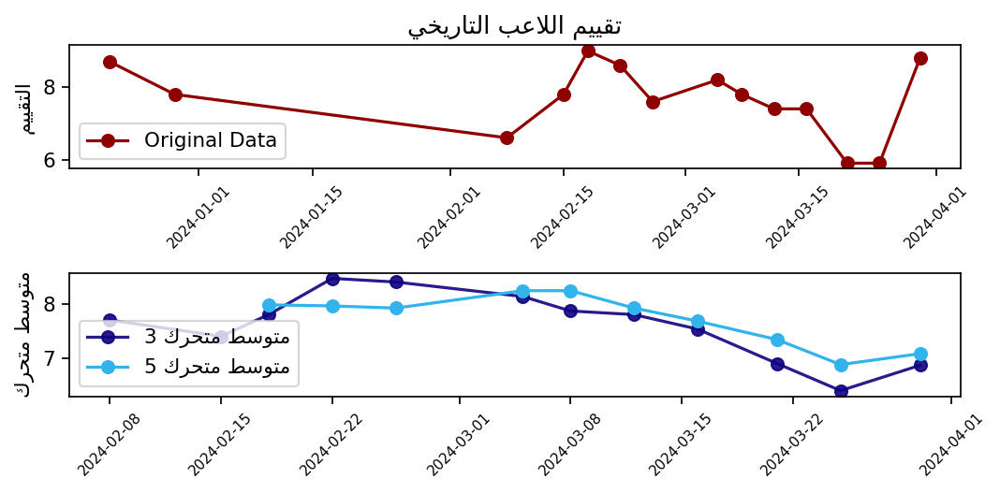

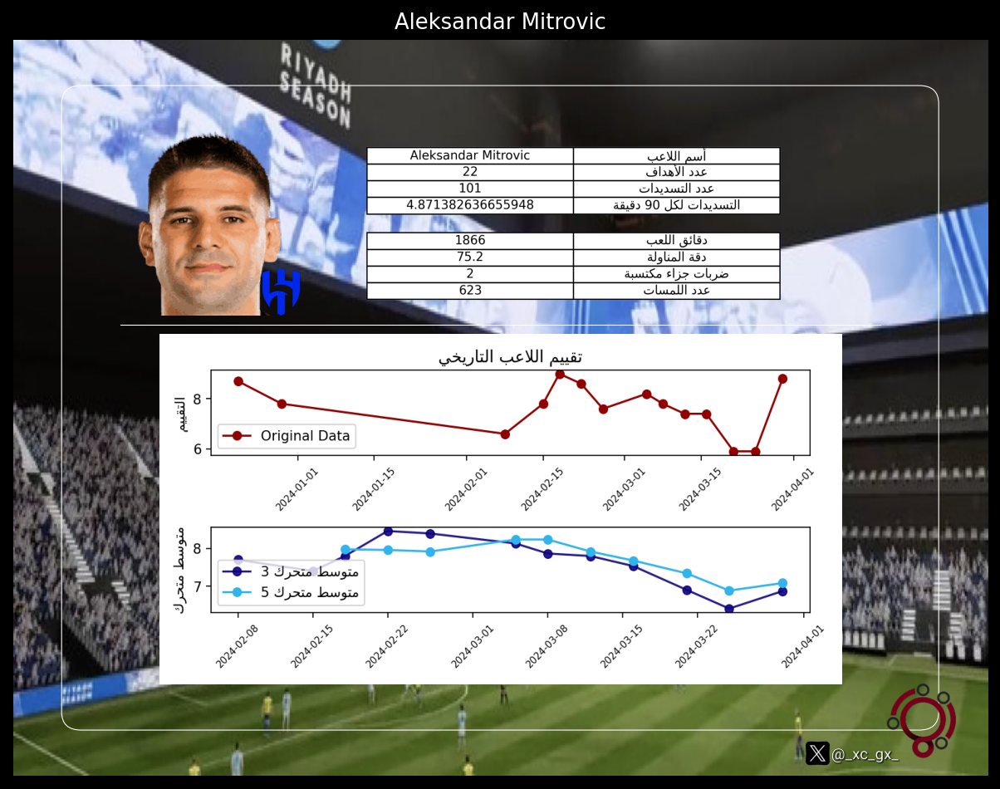

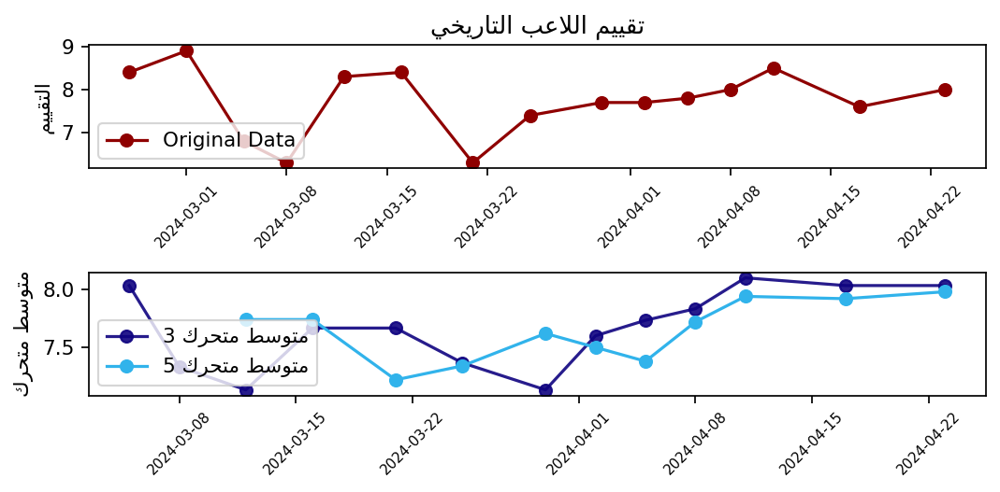

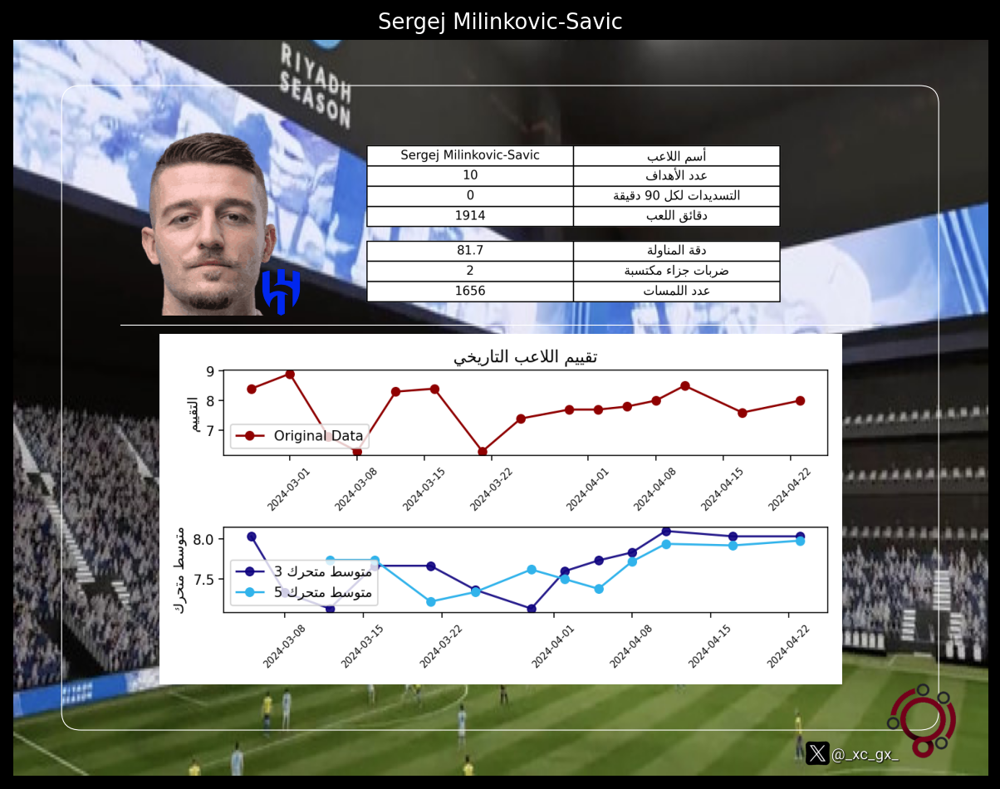

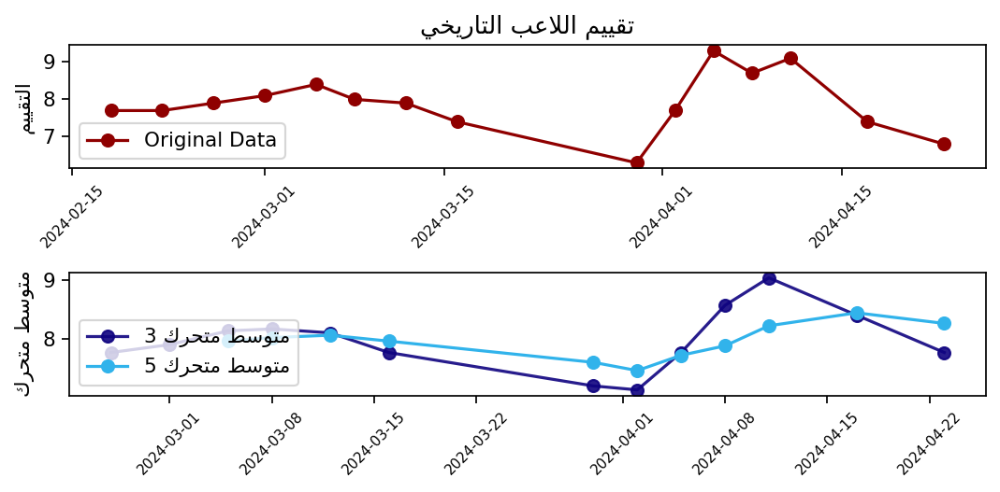

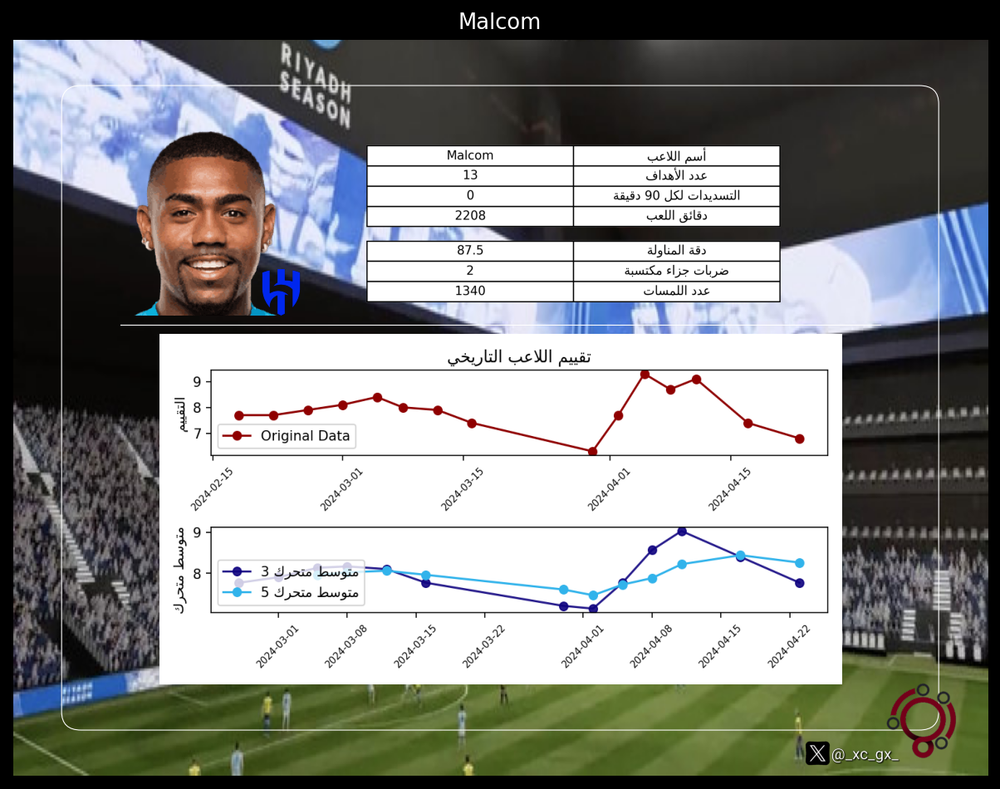

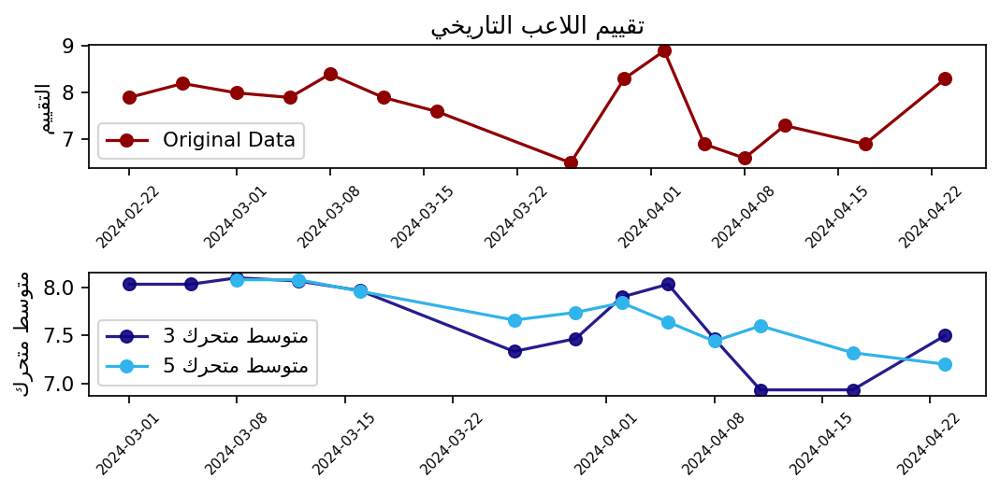

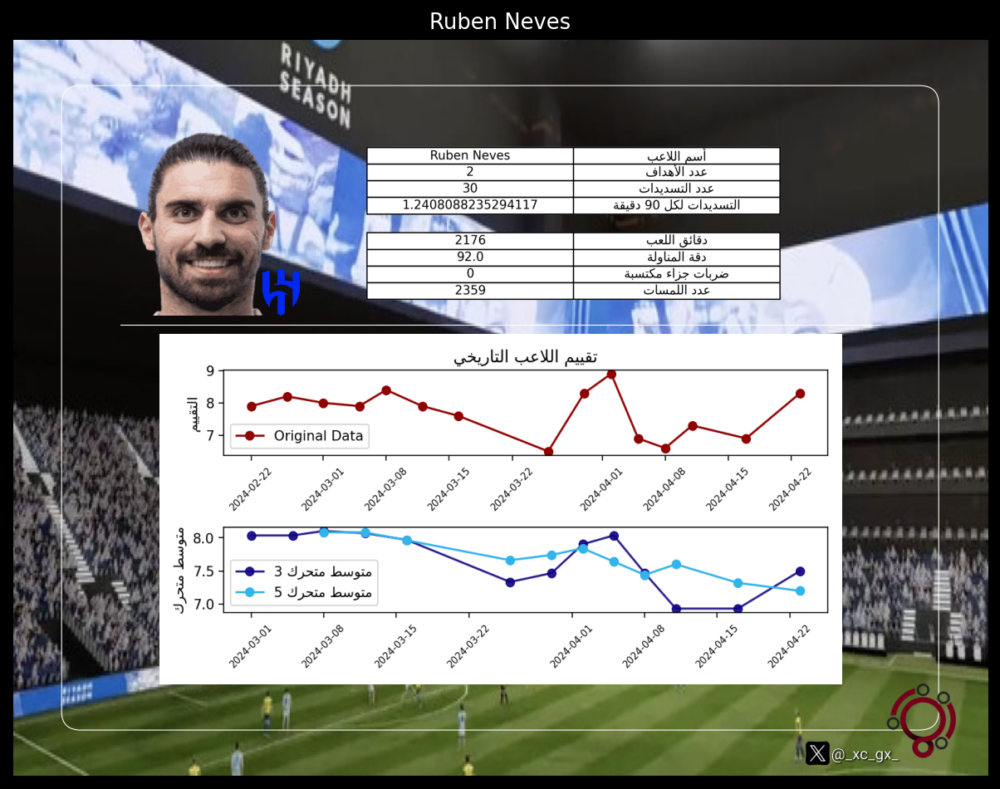

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

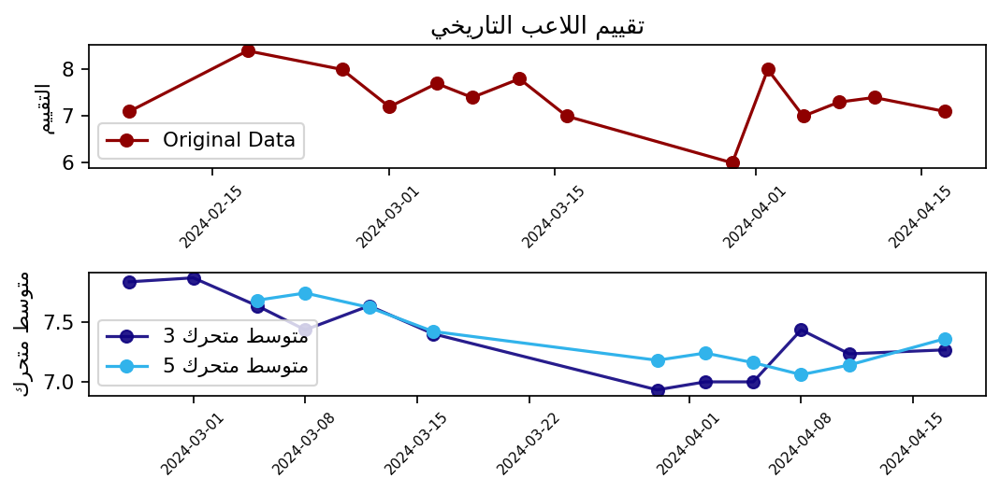

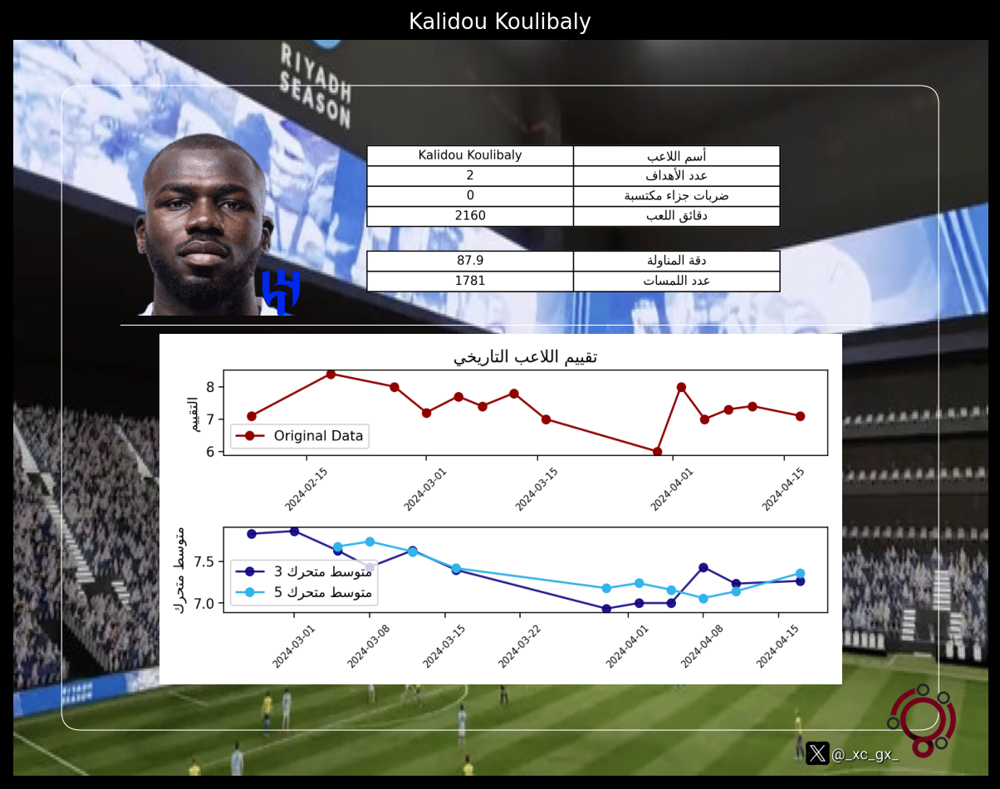

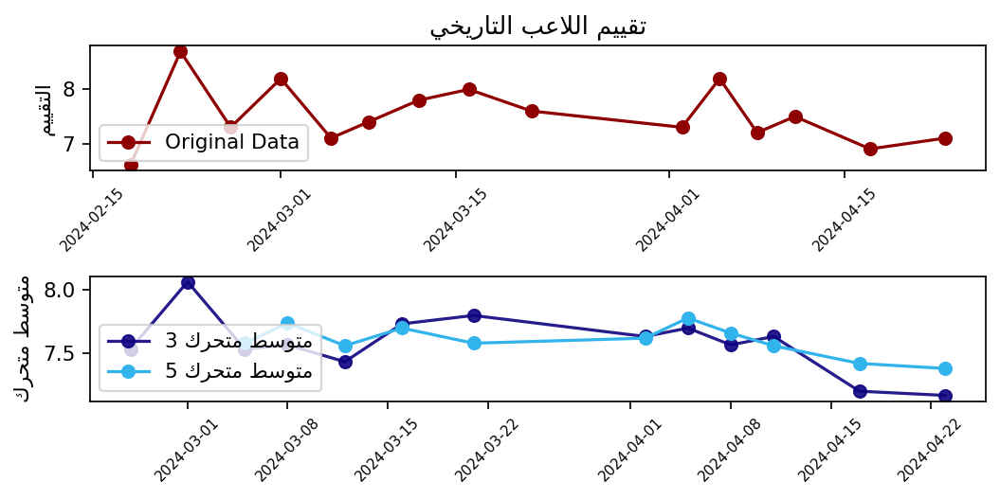

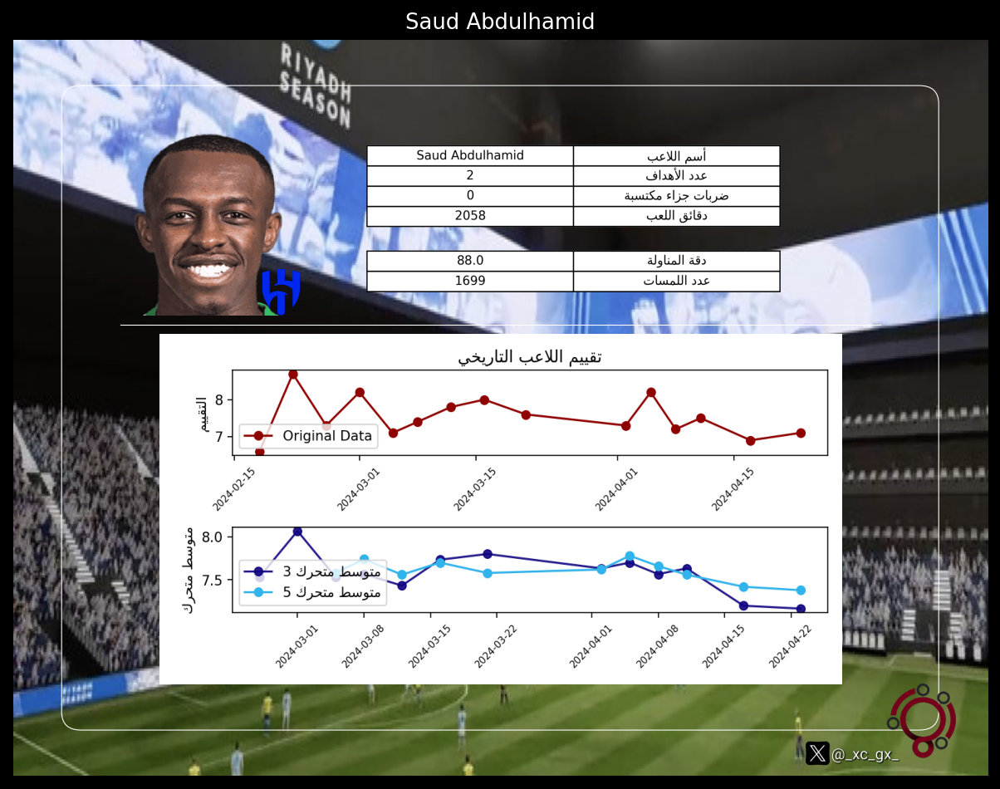

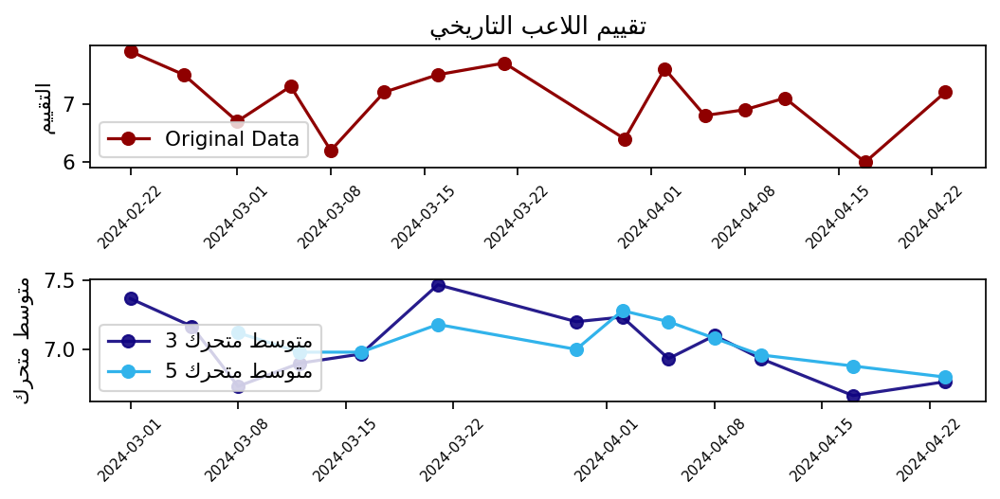

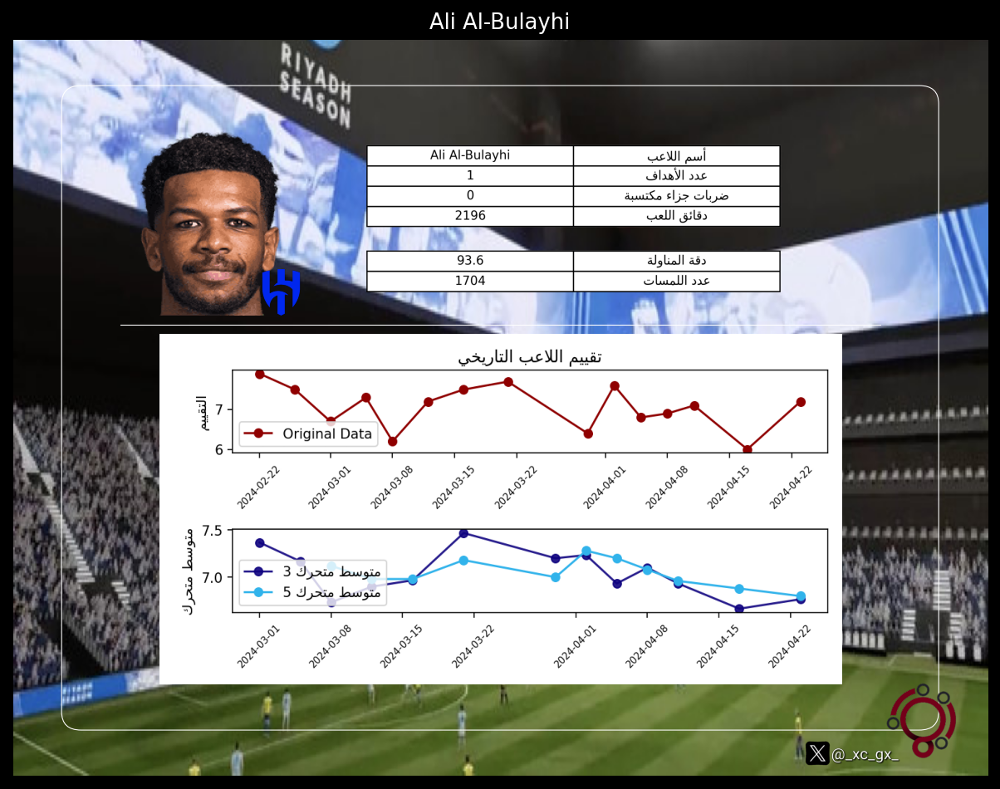

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

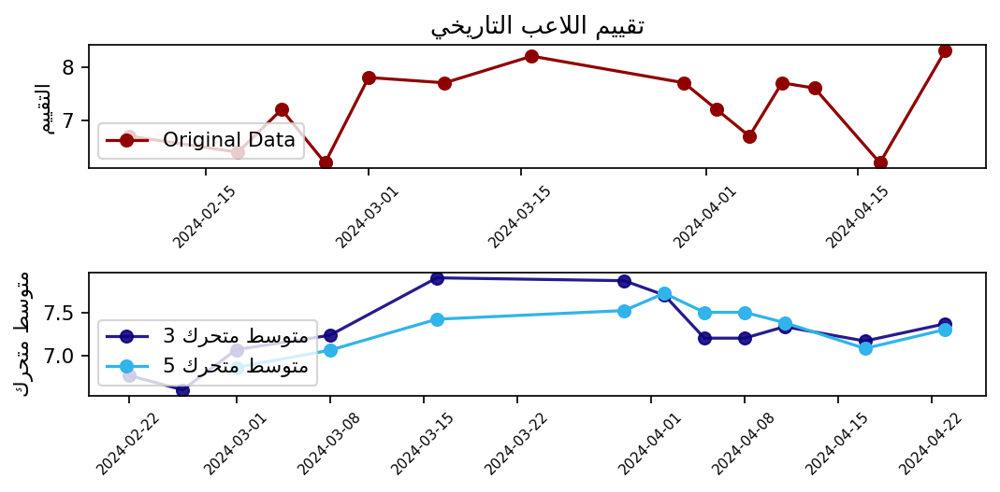

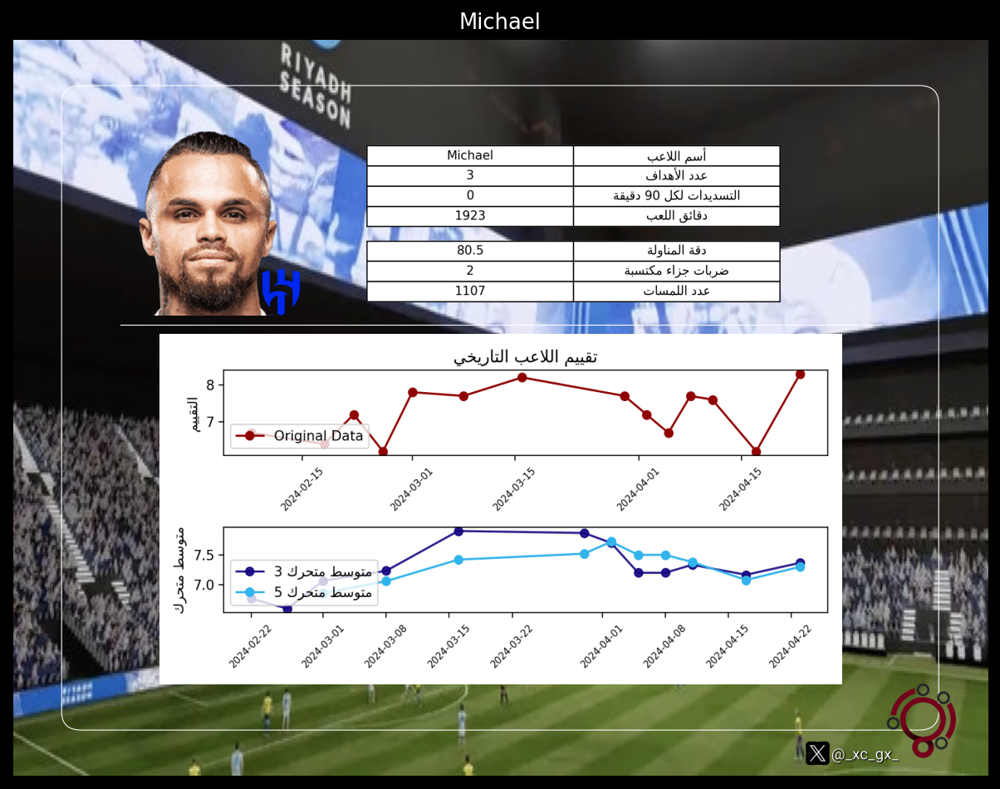

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

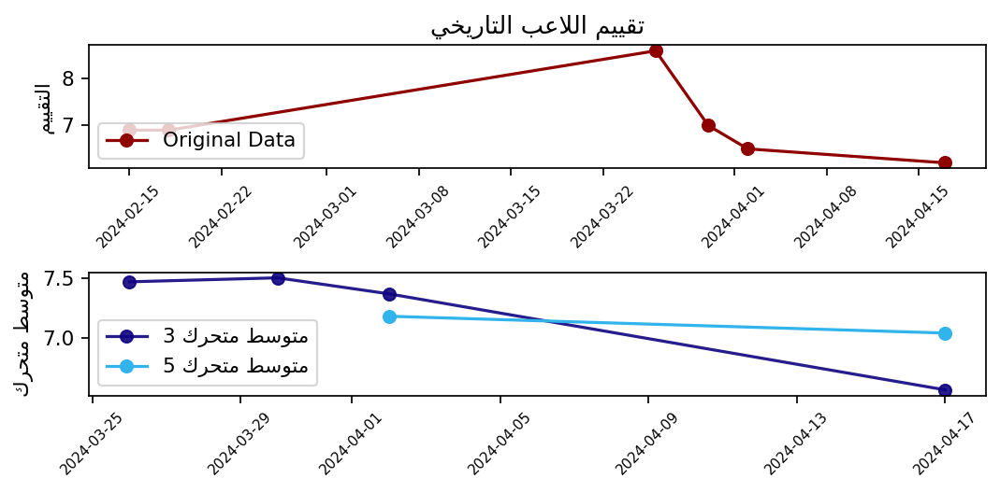

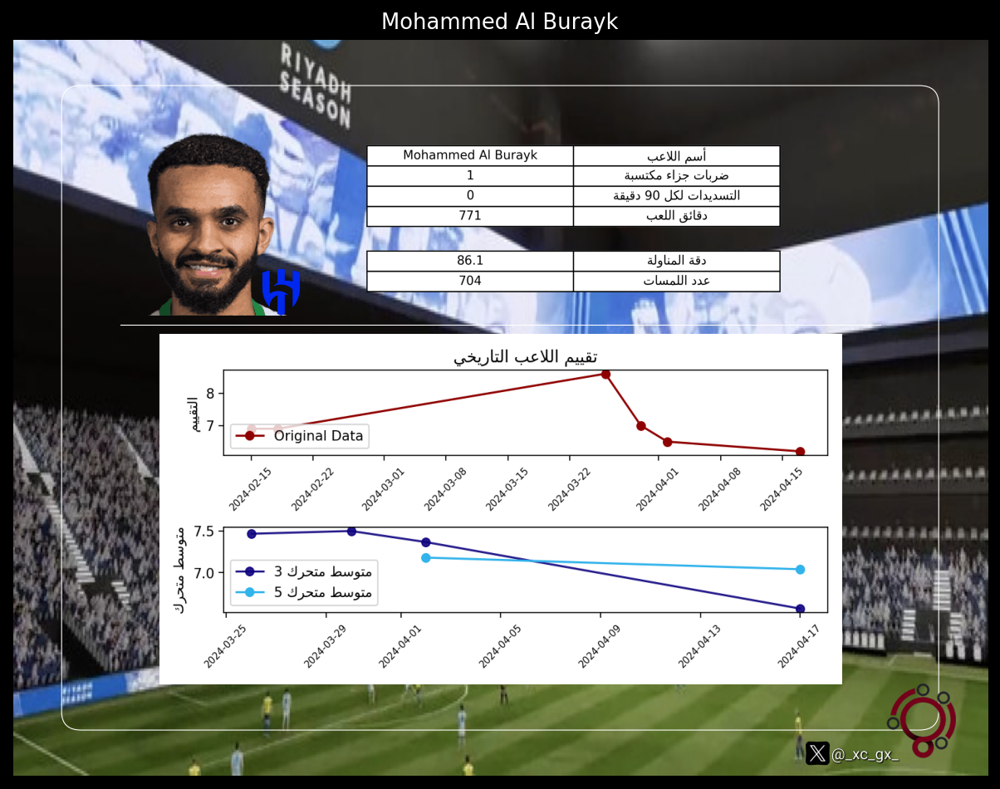

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

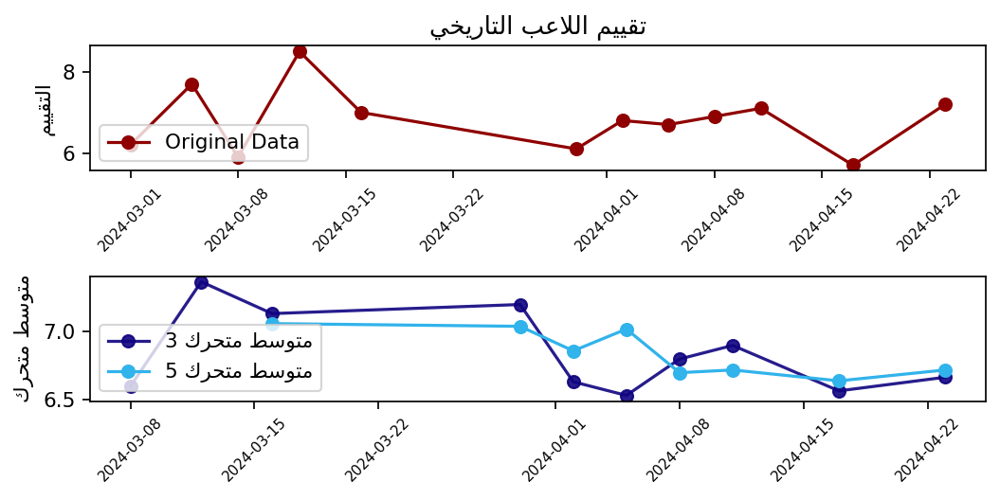

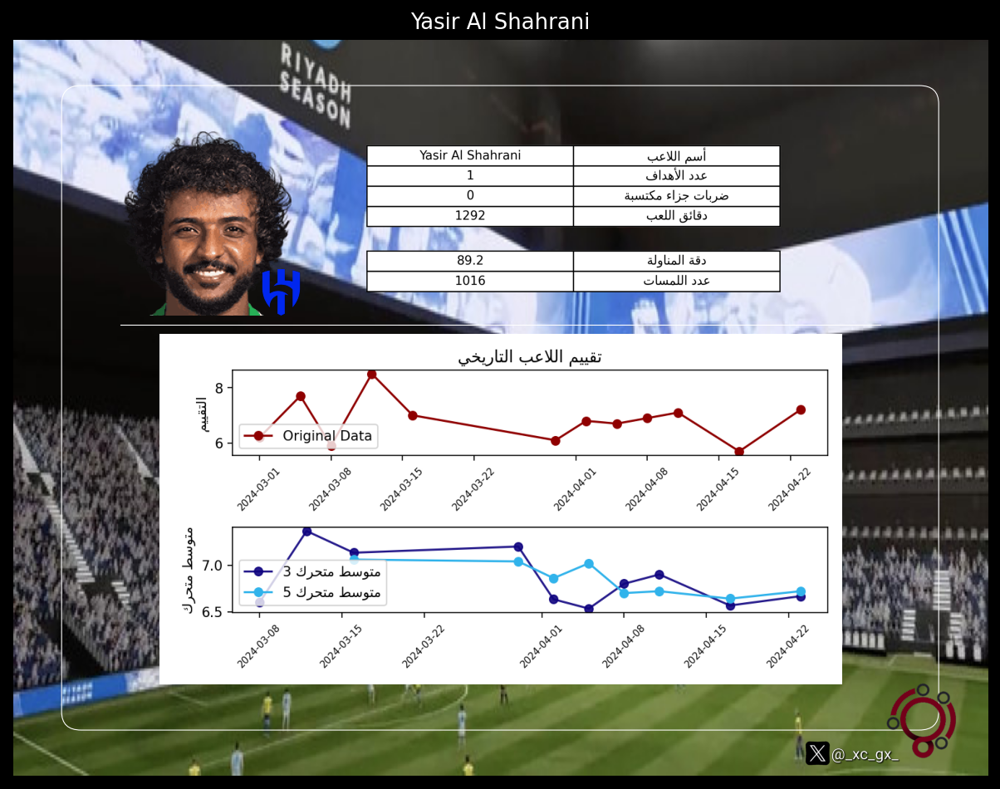

C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Match Date (UTC)'] = pd.to_datetime(df_filtered['Match Date (UTC)'])
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['MA_3'] = df_filtered['Rating'].rolling(window=3, min_periods=3).mean()
C:\Users\ASUS\AppData\Local\Temp\ipykernel_70740\490424728.py:88: SettingWithCopyWarning: 
A value is trying to be set on 

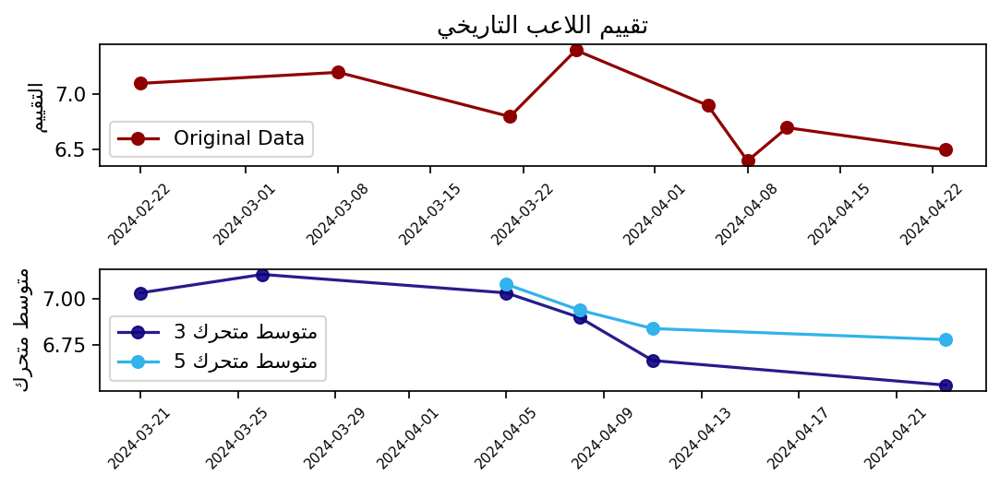

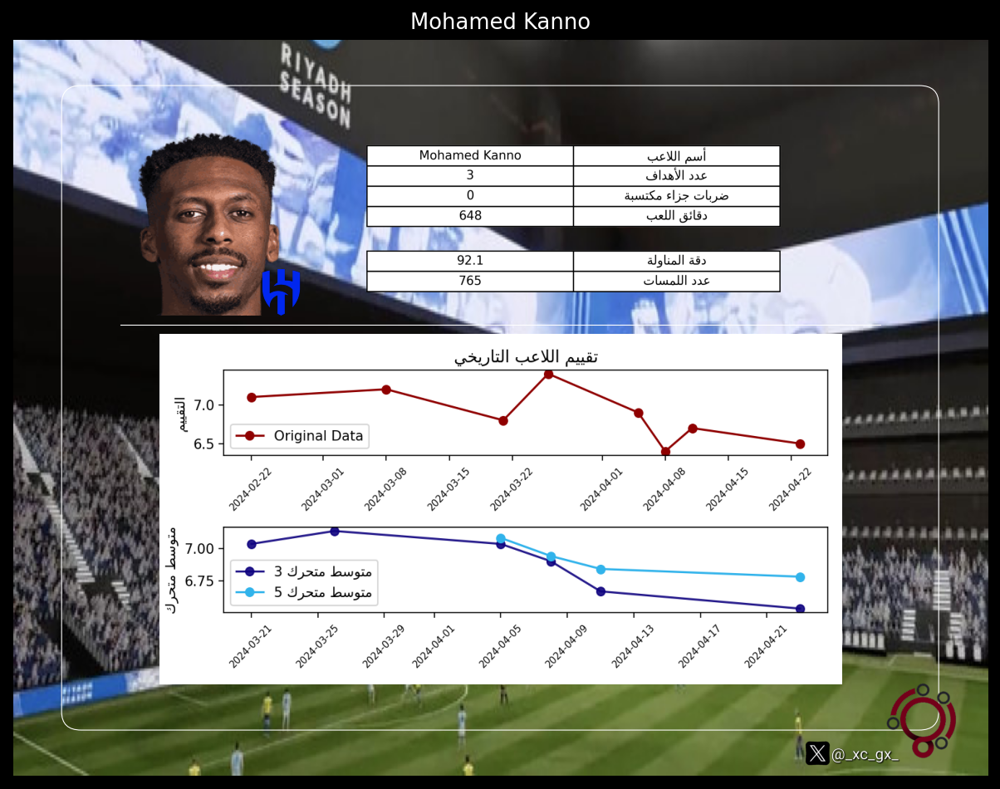

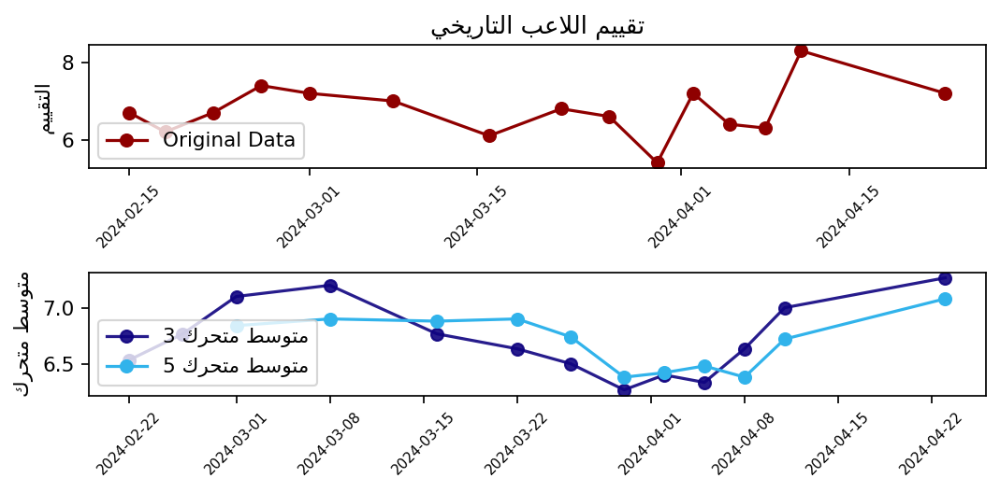

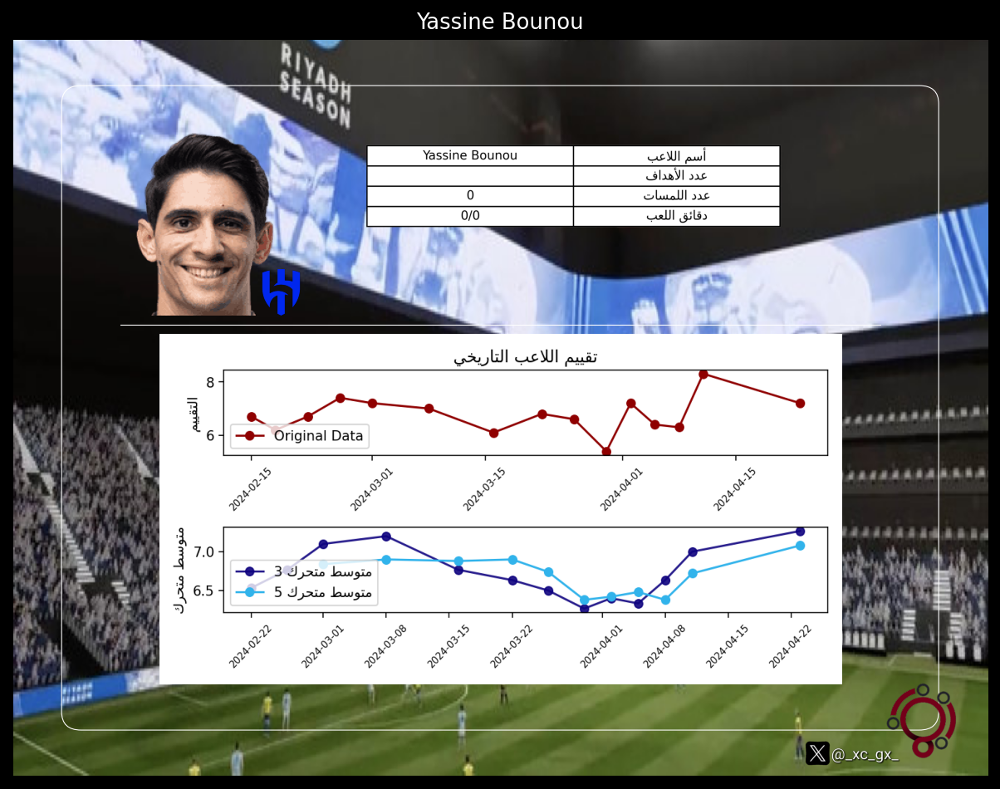

In [3]:
for i in players_id_list:
    StatsGenerator(i)

In [116]:
# LIST FINAL IMAGES WITH ANALYSIS
import os

# Specify the directory path
directory_path = r'C:\Users\ASUS\Desktop\football_analysis'

# List all files in the directory
files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
P_NAMES = [f_[0:-4] for f_ in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f_))]

# Print the list of files
#print("Files in the directory:", files, P_NAMES)


In [ ]:
# SHARE DATA ON TWITTER NON AUTO
import requests
from requests_oauthlib import OAuth1

# Twitter API credentials
consumer_key = "jBvqcNW3gJpFtzOqqFl6kgp5T"
consumer_secret = "OTEaM0IOWJBLcKsBqJLm2E4D7ZQStSypCyLmdnmiTHpf8sbRoK"
access_token = "839448472474566657-oe8tcmakX31HBpmkoc239a8alSBug6j"
access_token_secret = "kZerJXmJMq7xuH8Mtwc89LReN8VJqjmrqeDxAVtJGjcL0"

def upload_media(image_path):
    upload_url = "https://upload.twitter.com/1.1/media/upload.json"
    auth = OAuth1(consumer_key, consumer_secret, access_token, access_token_secret)
    files = {'media': open(image_path, 'rb')}
    response = requests.post(upload_url, auth=auth, files=files)
    if response.status_code not in [200, 201]:
        raise Exception(response.status_code, response.text)
    media_id = response.json()['media_id_string']
    return media_id

def post_tweet_with_image(text, image_path):
    media_id = upload_media(image_path)
    post_url = "https://api.twitter.com/2/tweets"
    auth = OAuth1(consumer_key, consumer_secret, access_token, access_token_secret)
    tweet_data = {"text": text, "media": {"media_ids": [media_id]}}
    
    response = requests.post(post_url, auth=auth, json=tweet_data)
    if response.status_code not in [200, 201]:
        raise Exception(response.status_code, response.text)

    return response.json()

# Example usage:
image_path = "C:\\Users\\ASUS\\Desktop\\football_analysis\\"+files[8]
tweet_text = "تحليل لأداء بطلنا سالم الدوسري :) #الهلال_العين #العين_الهلال #Mitrovic #الهلال_بياخذ_حق_النصر_اليوم #الهلال_العين_ابطال_اسيا #الهلال_قدها #ميتروفيتش #سافيتش #بونو #سالم #مالكوم"
post_tweet_with_image(tweet_text, image_path)


In [117]:
# AUTOMATED SHARING

def auto_tweet(files, P_NAMES):

    # SHARE DATA ON TWITTER
    import requests
    from requests_oauthlib import OAuth1

    # Twitter API credentials
    consumer_key = "jBvqcNW3gJpFtzOqqFl6kgp5T"
    consumer_secret = "OTEaM0IOWJBLcKsBqJLm2E4D7ZQStSypCyLmdnmiTHpf8sbRoK"
    access_token = "839448472474566657-oe8tcmakX31HBpmkoc239a8alSBug6j"
    access_token_secret = "kZerJXmJMq7xuH8Mtwc89LReN8VJqjmrqeDxAVtJGjcL0"

    def upload_media(image_path):
        upload_url = "https://upload.twitter.com/1.1/media/upload.json"
        auth = OAuth1(consumer_key, consumer_secret, access_token, access_token_secret)
        files = {'media': open(image_path, 'rb')}
        response = requests.post(upload_url, auth=auth, files=files)
        if response.status_code not in [200, 201]:
            raise Exception(response.status_code, response.text)
        media_id = response.json()['media_id_string']
        return media_id

    def post_tweet_with_image(text, image_path):
        media_id = upload_media(image_path)
        post_url = "https://api.twitter.com/2/tweets"
        auth = OAuth1(consumer_key, consumer_secret, access_token, access_token_secret)
        tweet_data = {"text": text, "media": {"media_ids": [media_id]}}

        response = requests.post(post_url, auth=auth, json=tweet_data)
        if response.status_code not in [200, 201]:
            raise Exception(response.status_code, response.text)

        return response.json()

    # Example usage:
    image_path = "C:\\Users\\ASUS\\Desktop\\football_analysis\\"+files
    tweet_text = "تحليل لأداء "+P_NAMES+" :) #الهلال_العين #العين_الهلال #Mitrovic #الهلال_بياخذ_حق_النصر_اليوم #الهلال_العين_ابطال_اسيا #الهلال_قدها #ميتروفيتش #سافيتش #بونو #سالم #مالكوم"
    post_tweet_with_image(tweet_text, image_path)

for i in range(len(files)):
    auto_tweet(files[i], files[i][:-4])

In [106]:
data['statsData']

[{'id': 600850,
  'teamId': 102117,
  'name': 'Kaku',
  'substatValue': {'value': 1, 'format': 'number', 'fractions': 0},
  'statValue': {'name': 'rating',
   'value': 7.77,
   'format': 'fraction',
   'fractions': 2},
  'rank': 1,
  'type': 'players'},
 {'id': 988749,
  'teamId': 102117,
  'name': 'Soufiane Rahimi',
  'substatValue': {'value': 2, 'format': 'number', 'fractions': 0},
  'statValue': {'name': 'rating',
   'value': 7.64,
   'format': 'fraction',
   'fractions': 2},
  'rank': 2,
  'type': 'players'},
 {'id': 736081,
  'teamId': 102117,
  'name': 'Kodjo Laba',
  'substatValue': {'value': 4, 'format': 'number', 'fractions': 0},
  'statValue': {'name': 'rating',
   'value': 7.56,
   'format': 'fraction',
   'fractions': 2},
  'rank': 3,
  'type': 'players'},
 {'id': 1069974,
  'teamId': 102117,
  'name': 'Erik',
  'substatValue': {'value': 0, 'format': 'number', 'fractions': 0},
  'statValue': {'name': 'rating',
   'value': 7.54,
   'format': 'fraction',
   'fractions': 2},
 